<a href="https://colab.research.google.com/github/AleksandraVrekic/PPPO/blob/main/Aleksandra_Vrekic_IT25_2019.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Predmet:** Principi prezentacije i prepoznavanja oblika
### **Tema:** Klasifikacija - Lego figure
### **Student:** Aleksandra Vrekić
### **Index:** IT25-2019

## **Klasifikacija**

Mašinsko učcenje predstavlja disciplinu koja se bavi izvođenjem algoritama iz podataka, bez eksplicitnog programiranja. Obično se identifikuju tri grupe problema mašinskog učenja, a to su problemi nadgledanog učenja, problemi nenadgledanog učenja i problemi učenja  potkrepljivanje. Termin „nadgledano učenje“ odnosi se na skup trening primera - ulaznih podataka, gde su signali željenog izlaza - oznake već poznati. Dve osnovne vrste problema nadgledanog učenja su regresija i klasifikacija.

Klasifikacija je problem predviđanja kategoričke ciljne promenljive. Kategoričkim se smatraju promenljive koje uzimaju konačan broj vrednosti među kojima nema uređenja. Dakle, u klasifikaciji postoji ciljana kategorička promenljiva odnosno atribut, čiju vrednost treba odrediti. Klasifikacija se odnosi na dodelu pojave/entitete u određenu kategoriju na osnovu vrednosti ostalih atributa. Na primer, prepoznavanje jedne iz skupa poznatih osoba čije se lice nalazi na slici je problem klasifikacije. Prepoznavanje da li se novinski članak tiče ekonomije, sporta ili politike je takode problem klasifikacije. U okviru mašinskog učenja, konkretno za uspešnost zadatka klasifikacije važno je da set ulaznih podataka bude dovoljno obiman, kao i da podaci unutar seta podataka budu raznovrsni kako bi se dobio dobro istreniran model.

U ovom projektu, korišćen je set podataka koji sadrži fotografije lego figura različitih fiktivnih likova, a cilj klasifikacije je odrediti kojoj klasi pripadaju, odnosno koji je lik sa slike. Zadatak ćemo realizovati uz pomoć unapred istrenirane neuronske mreže - DenseNet121.

## **Biblioteke**

U izradi rada biće nam potrebne odredjene biblioteke i prvi korak će biti njihovo importovanje.

NumPy je biblioteka za Python koja omogućava rad sa numeričkim podacima. Pruža efikasne operacije za manipulaciju nizovima i matricama.

Pandas je biblioteka za analizu i manipulaciju podacima. Omogućava rad sa tabelarnim podacima (DataFrame) i pruža funkcionalnosti kao što su filtriranje, grupisanje i agregacija podataka.

Seaborn je biblioteka za vizualizaciju podataka zasnovana na Matplotlibu. Pruža veći broj stilizovanih grafikona i olakšava kreiranje atraktivnih vizualizacija podataka.

OpenCV (Open Source Computer Vision Library) je biblioteka za obradu slika i kompjutersku viziju. Koristi se za manipulaciju slikama, detekciju objekata, prepoznavanje oblika i mnoge druge zadatke vezane za obradu slika.

TensorFlow je popularna biblioteka za mašinsko učenje i duboko učenje. Omogućava kreiranje i treniranje različitih tipova neuronskih mreža, uključujući konvolutivne neuronske mreže (CNN) i rekurentne neuronske mreže (RNN).

Matplotlib je biblioteka za vizualizaciju podataka u Pythonu. Pruža alate za kreiranje različitih tipova grafova i dijagrama, što je korisno za prikazivanje rezultata analize podataka i modela.

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
# Uvoz biblioteke OpenCV za obradu slika
import cv2
import os

import tensorflow as tf
from tensorflow.keras.applications import mobilenet_v2 as tf_mobilenet_v2
from tensorflow.keras import layers,models
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Flatten,Dropout, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import load_img,img_to_array

from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

## **Učitavanje podataka**

Podaci potrebni za ovaj projekat su preuzeti kao zip datoteka sa Google Drive platforme.

Set podataka se sastoji od 5 foldera:
marvel, harry-potter, star-wars, jurassic-world i test.

In [ ]:
!pip install gdown

Defaulting to user installation because normal site-packages is not writeable


In [ ]:
import gdown

In [ ]:
# Uvoz modula os za interakciju sa operativnim sistemom
import os

file_url = "https://drive.google.com/file/d/1RxKmPkhzCZFK-w7s3KC5ljsHOOu53VMk/view?usp=sharing"
os.system(f"gdown --fuzzy {file_url}")


1

## **Pregled i analiza podataka**

Ovo poglavlje se odnosi na razumevanje, pripremu i vizualizaciju učitanog skupa podataka kako bi se stekao uvid u karakteristike podataka kojima raspolažemo. Prvo se vrši grafički prikaz slika iz seta u cilju provere uspešnosti preuzetih izvornih podataka.

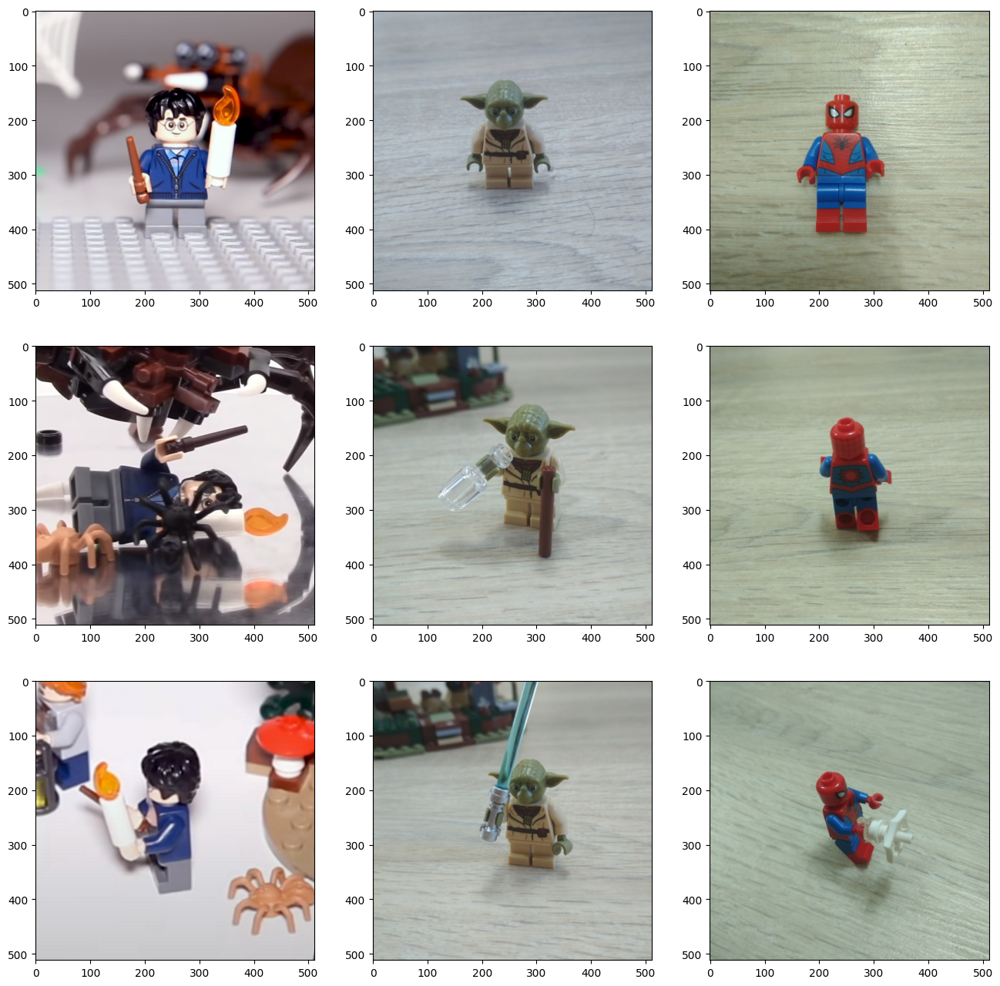

In [ ]:
images = [[],[],[]]
index = ['004', '006', '007']

for i in range(3):
    images[i].append(mpimg.imread('harry-potter/0001/' + index[i] + '.jpg'))
    images[i].append(mpimg.imread('star-wars/0001/' + index[i] + '.jpg'))
    images[i].append(mpimg.imread('marvel/0001/' + index[i] + '.jpg'))

fig, axs = plt.subplots(3,3, figsize=(16,16))

for i in range(3):
    for j in range(3):
        axs[i, j].imshow(images[i][j])

Ovaj korak predstvlja učitavanje jedne slike iz seta podataka i pretvaranje slike u trodimenzionalni NumPy niz. Iz rezultata vidimo da je slika dimenzije 512x512 piksela (dužina x širina), a broj 3 nam govori da se radi o slikama sa 3 kanala boje(RGB).

In [ ]:
image = load_img("marvel/0001/004.jpg")
x=img_to_array(image)
print(x.shape)

(512, 512, 3)


U narednom koraku vršimo učitavanje index.csv fajla koji za svaku sliku sadži numeričku oznaku (class_id) koja predstvalja broj klase kojoj ta slika pripada.

In [ ]:
index_df = pd.read_csv('index.csv')
index_df

,path,class_id
0,marvel/0001/001.jpg,1
1,marvel/0001/002.jpg,1
2,marvel/0001/003.jpg,1
3,marvel/0001/004.jpg,1
4,marvel/0001/005.jpg,1
...,...,...
366,star-wars/0017/006.jpg,38
367,star-wars/0017/007.jpg,38
368,star-wars/0017/008.jpg,38
369,star-wars/0017/009.jpg,38


U ovoj ćeliji se učitava CSV datoteka metadata.csv. Učitani podaci se smeštaju u DataFrame objekat metadata_df. Takođe je ispisan ukupan broj klasa kojima figurice mogu da priradaju.

In [ ]:
metadata_df = pd.read_csv('metadata.csv', encoding='latin-1')
n_classes = metadata_df.shape[0]
print("total number of classes: ", n_classes)
metadata_df

total number of classes:  38


,class_id,lego_ids,lego_names,minifigure_name
0,1,[76115],['Spider Mech vs. Venom'],SPIDER-MAN
1,2,[76115],['Spider Mech vs. Venom'],VENOM
2,3,[76115],['Spider Mech vs. Venom'],AUNT MAY
3,4,[76115],['Spider Mech vs. Venom'],GHOST SPIDER
4,5,[75208],"[""Yoda's Hut""]",YODA
5,6,[75208],"[""Yoda's Hut""]",LUKE SKYWALKER
6,7,[75208],"[""Yoda's Hut""]",R2-D2
7,8,[75199],"[""General Grievous' Combat Speeder""]",MACE WINDU
8,9,[75199],"[""General Grievous' Combat Speeder""]",GENERAL GRIEVOUS
9,10,[75264],"[""Kylo Ren's Shuttle Microfighter""]",KYLO REN


Prethodna dva DataFramea se spajaju na osnovu zajedničke kolone 'class_id' i smeštaju se u novi DataFrame. Novi DataFrame sadrži podatke kao što su putanja na kojoj se slika nalazi, numerička oznaka klase kojoj priprada figurica na slici i naziv figure.

In [ ]:
data_df = pd.merge(index_df, metadata_df[['class_id', 'minifigure_name']], on='class_id')
data_df

,path,class_id,minifigure_name
0,marvel/0001/001.jpg,1,SPIDER-MAN
1,marvel/0001/002.jpg,1,SPIDER-MAN
2,marvel/0001/003.jpg,1,SPIDER-MAN
3,marvel/0001/004.jpg,1,SPIDER-MAN
4,marvel/0001/005.jpg,1,SPIDER-MAN
...,...,...,...
366,star-wars/0017/006.jpg,38,BOBA FETT
367,star-wars/0017/007.jpg,38,BOBA FETT
368,star-wars/0017/008.jpg,38,BOBA FETT
369,star-wars/0017/009.jpg,38,BOBA FETT


Primernom komande info() na fajl data_df može se dobiti više informacija o strukturi i sadržaju odabranog skupu podaka, kao što su broj redova, broj kolona, nazivi kolona i njihovi tipovi podataka, memorija koju zauzima itd...

In [ ]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 371 entries, 0 to 370
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   path             371 non-null    object
 1   class_id         371 non-null    int64 
 2   minifigure_name  371 non-null    object
dtypes: int64(1), object(2)
memory usage: 8.8+ KB


Sledi grafički prikaz nasumičnih slika iz skupa podataka, kao i nazivi klase figurica na njima.

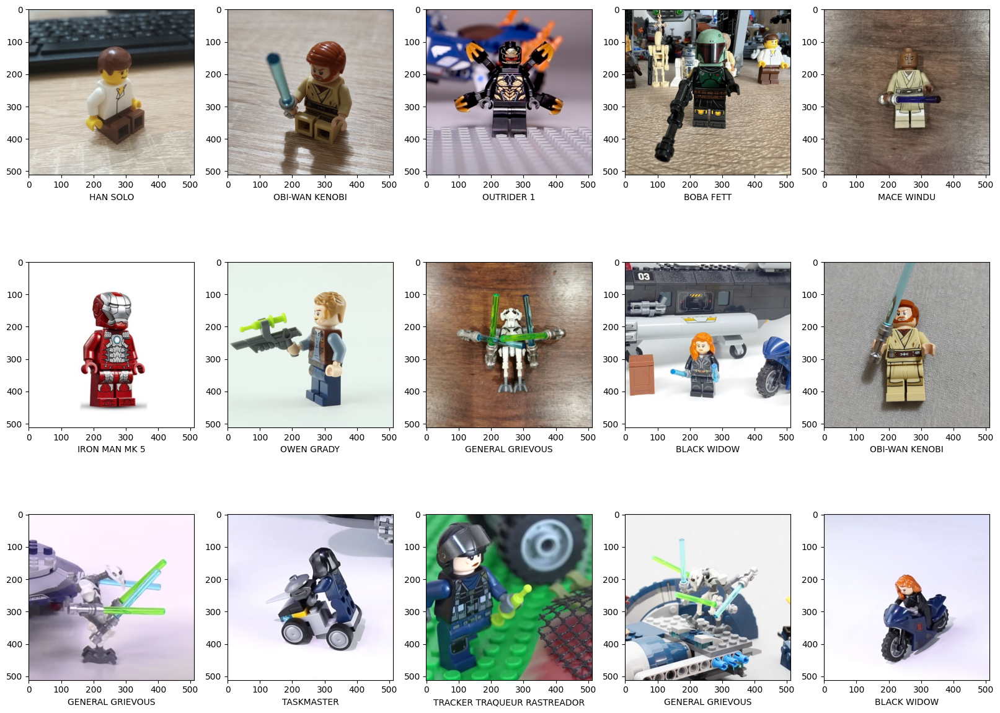

In [ ]:
sample_df=data_df.sample(20)

plt.figure(figsize=(20,15))
i=0
for i in range(15):
    plt.subplot(3,5,i+1)
    plt.grid(False)
    img=load_img(sample_df['path'].values[i])
    plt.imshow(img)
    plt.xlabel(sample_df['minifigure_name'].values[i])
    i += 1
plt.show()

Sada je potrebno učitati testne podatke iz test.csv fajla. Iz ovog fajla izbacuje se kolona class_id i ostatak podataka smeštamo u novi fajl pod nazivom X_test.

In [ ]:
test_df = pd.read_csv('test.csv')
X_test = test_df.drop(columns = ['class_id'])
X_test

,path
0,test/001.jpg
1,test/002.jpg
2,test/003.jpg
3,test/004.jpg
4,test/005.jpg
...,...
74,test/075.jpg
75,test/076.jpg
76,test/077.jpg
77,test/078.jpg


U okviru y_test smeštaju se oznake klasa za testni skup podataka

In [ ]:
y_test = test_df['class_id']
y_test

0     32
1     32
2     32
3     32
4      1
      ..
74    37
75    37
76    38
77    38
78    38
Name: class_id, Length: 79, dtype: int64

Spajanje testnog skupa podataka sa metapodacima po class_id. Sortiranje podataka po obeležju path.

In [ ]:
test_actual_df = pd.merge(test_df, metadata_df[['class_id', 'minifigure_name']], on='class_id')
test_actual_df = test_actual_df.sort_values('path')
test_actual_df

,path,class_id,minifigure_name
0,test/001.jpg,32,JANNAH
1,test/002.jpg,32,JANNAH
2,test/003.jpg,32,JANNAH
3,test/004.jpg,32,JANNAH
4,test/005.jpg,1,SPIDER-MAN
...,...,...,...
74,test/075.jpg,37,OBI-WAN KENOBI
75,test/076.jpg,37,OBI-WAN KENOBI
76,test/077.jpg,38,BOBA FETT
77,test/078.jpg,38,BOBA FETT


Kreiramo novi dataset X_data koji sadrži obeležija iz data_df, s tim da je izuzeto obeležje class_id.

In [ ]:
X_data = data_df.drop(columns = ['class_id'])
X_data

,path,minifigure_name
0,marvel/0001/001.jpg,SPIDER-MAN
1,marvel/0001/002.jpg,SPIDER-MAN
2,marvel/0001/003.jpg,SPIDER-MAN
3,marvel/0001/004.jpg,SPIDER-MAN
4,marvel/0001/005.jpg,SPIDER-MAN
...,...,...
366,star-wars/0017/006.jpg,BOBA FETT
367,star-wars/0017/007.jpg,BOBA FETT
368,star-wars/0017/008.jpg,BOBA FETT
369,star-wars/0017/009.jpg,BOBA FETT


In [ ]:
y_data = data_df['class_id']
y_data

0       1
1       1
2       1
3       1
4       1
       ..
366    38
367    38
368    38
369    38
370    38
Name: class_id, Length: 371, dtype: int64

## **Trening i test podaci**
Naredni kod izvršava podelu podataka (X_data i y_data) na trening i validacioni skup koristeći funkciju train_test_split. 80% podataka biti rezervisano za trening, a 20% skupa podataka za validaciju.

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X_data, y_data,
    test_size=0.20, random_state= 8)

Sledeći korak predstavlja pripremu podataka za klasifikaciju u vidu normalizacije i standardizacije podataka. Korišćenjem funkicije resize vrši se promene veličina slika, gde je veličina slika smanjena na 224 x 224 piksela, pošto nam je ova dimenzija potrebna za rad sa modelima. Pomoću funkcije cvtColor, boje slike se konvertuju iz BGR u RGB. Takođe, izvršena je normalizacija trening podataka, kako bi podaci bili u opsegu 0-1.

In [ ]:
X_train_converted = np.zeros((X_train.shape[0], 224, 224, 3))

for i in range(X_train.shape[0]):
    image = cv2.imread(X_train["path"].values[i])
    image = cv2.resize(image, dsize=(224,224)) # resize in case if image was not 224x224 pixels
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    X_train_converted[i] = image/255

y_train_converted = np.array(y_train)-1

In [ ]:
X_train_converted[0]

array([[[0.69803922, 0.68627451, 0.66666667],
        [0.69411765, 0.68235294, 0.6627451 ],
        [0.69411765, 0.68235294, 0.65490196],
        ...,
        [0.59215686, 0.54509804, 0.49019608],
        [0.59607843, 0.54901961, 0.49411765],
        [0.59215686, 0.54509804, 0.49019608]],

       [[0.68627451, 0.6745098 , 0.65490196],
        [0.68627451, 0.6745098 , 0.64705882],
        [0.68235294, 0.67058824, 0.64313725],
        ...,
        [0.60392157, 0.55686275, 0.50196078],
        [0.60392157, 0.55686275, 0.50196078],
        [0.59607843, 0.54901961, 0.49411765]],

       [[0.67843137, 0.6627451 , 0.63921569],
        [0.67843137, 0.6627451 , 0.63921569],
        [0.6745098 , 0.65490196, 0.63137255],
        ...,
        [0.6       , 0.55294118, 0.49803922],
        [0.60392157, 0.55686275, 0.50196078],
        [0.6       , 0.55294118, 0.49803922]],

       ...,

       [[0.58431373, 0.55686275, 0.52156863],
        [0.66666667, 0.63529412, 0.61176471],
        [0.63529412, 0

Isti postupak ponavljamo i za validacione podatke.

In [ ]:
X_val_converted = np.zeros((X_val.shape[0], 224, 224, 3))

for i in range(X_val.shape[0]):
    image = cv2.imread(X_val["path"].values[i])
    image = cv2.resize(image, dsize=(224,224))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    X_val_converted[i] = image/255

y_val_converted = np.array(y_val)-1

In [ ]:
X_val_converted[0]

array([[[0.37254902, 0.34117647, 0.2745098 ],
        [0.38823529, 0.34901961, 0.28235294],
        [0.38431373, 0.34901961, 0.28235294],
        ...,
        [0.56078431, 0.54901961, 0.48235294],
        [0.56470588, 0.54901961, 0.48235294],
        [0.55686275, 0.54509804, 0.47843137]],

       [[0.39215686, 0.36470588, 0.29411765],
        [0.41176471, 0.38431373, 0.31372549],
        [0.41176471, 0.37647059, 0.30980392],
        ...,
        [0.56470588, 0.55294118, 0.48627451],
        [0.57254902, 0.56078431, 0.49411765],
        [0.56862745, 0.55686275, 0.49019608]],

       [[0.41960784, 0.39215686, 0.32156863],
        [0.41176471, 0.38431373, 0.31372549],
        [0.40392157, 0.37647059, 0.30588235],
        ...,
        [0.56470588, 0.55294118, 0.48627451],
        [0.58039216, 0.56862745, 0.50196078],
        [0.56862745, 0.55686275, 0.49019608]],

       ...,

       [[0.30980392, 0.27058824, 0.23529412],
        [0.3372549 , 0.29803922, 0.2627451 ],
        [0.31372549, 0

Naredni kod prikazuje konverziju i pripremu testnih podataka.

In [ ]:
X_test_converted = np.zeros((X_test.shape[0], 224, 224, 3))

for i in range(X_test.shape[0]-1):
    image = cv2.imread(X_test["path"].values[i])
    image = cv2.resize(image, dsize=(224,224)) # resize in case if image was not 224x224 pixels
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    X_test_converted[i] = image/255

y_test_converted = np.array(y_test)

# **DenseNet121**

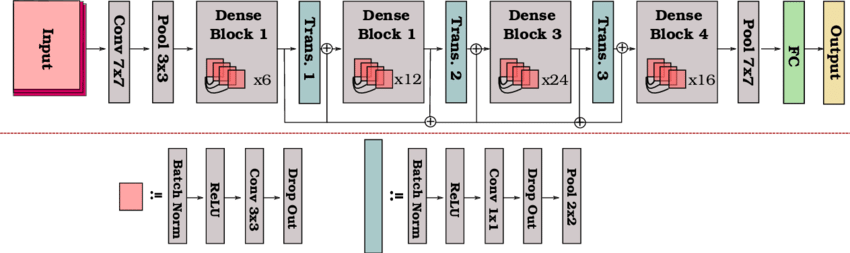

DenseNet, skraćenica od Dense Convolutional Network, je arhitektura dubokog učenja koja je izuzetno efikasna u zadacima klasifikacije slika.
Ono što izdvaja DenseNet od drugih arhitektura je njen jedinstveni obrazac povezanosti. Za razliku od tradicionalnih konvulucijskih neuronskih mreža (CNN), gde je svaki sloj povezan samo sa sledećim slojem, DenseNet uspostavlja direktne veze između svih slojeva. Ova guste povezanost omogućava efikasnije kretanje informacija kroz mrežu, što rezultira poboljšanim propagiranjem karakteristika i boljim tokom gradijenta. Gusta povezanost u DenseNet-u se postiže pomoću koncepta nazvanog „skip connections“ ili „shortcut“. Ovi prečice omogućavaju mreži da pristupi karakteristikama iz svih prethodnih slojeva, pružajući joj dublje razumevanje slike. Ovo ne samo da poboljšava sposobnost modela da uhvati fine detalje, već i pomaže u rešavanju problema nestajućeg gradijenta koji može otežati obuku dubokih neuronskih mreža. Još jedna ključna prednost DenseNet-a je njegova efikasnost u korišćenju parametara. Zahvaljujući gustoj povezanosti, značajne mape iz ranijih slojeva se više puta koriste u kasnijim slojevima. Ovo smanjuje broj potrebnih parametara, čineći DenseNet efikasnijim u upotrebi memorije i računarski manje skupim u odnosu na druge arhitekture. Kao rezultat toga, DenseNet može postići najbolje performanse sa manje parametara, čineći ga dobrim izborom za resursima ograničena okruženja.

U narednom koraku uvozimo arhitekturu modela DenseNet121 iz TensorFlow-ove biblioteke keras.applications. Zatim se kreira instanca DenseNet121 modela. Dodaje se sloj Dropout kako bismo sprečili overfitting modela. Dodajemo potpuno povezani sloj (Dense) kao posljednji sloj u modelu. Broj izlaznih neurona ovog sloja jednak je broju klasa u problemu. Zatim kreiramo konačni modela tako da se spaja ulazni sloj iz DenseNet121 modela (dense_net.input) i posljednji sloj koji smo dodali (last_layer). Ovo stvara potpuni model koji se sastoji od arhitekture DenseNet121 s dodatim slojem za klasifikaciju. Poslednji korak je konfiguriranje treninga modela.

In [ ]:
from tensorflow.keras.applications import DenseNet121
dense_net = tf.keras.applications.DenseNet121()

dense_net_layer=Dropout(0.5)(dense_net.layers[-2].output)
number_of_classes = len(data_df['class_id'].unique())

last_layer = Dense(number_of_classes, activation="softmax")(dense_net_layer)
model = Model(dense_net.input, last_layer)

model.compile(loss='sparse_categorical_crossentropy',
              optimizer=Adam(0.0001),
              metrics=['accuracy'])

Klasa ModelCheckpoint iz TensorFlow.keras.callbacks koristi se kako bi se automatski spremio najbolji model tokom treninga dubokog modela (neuronske mreže). Parametar 'filepath' definiše putanju do datoteke u kojoj će se smestiti najbolji model. Parametar 'monitor' označava koja metrika će se pratiti kako bi se odredilo koji je model najbolji. U ovom slučaju, metrika je "val_accuracy", što znači da će se pratiti tačnost modela na validacijskom skupu podataka.

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint

checkpoint = ModelCheckpoint(filepath='model.h5', monitor="val_accuracy", save_best_only=True, verbose=1)

Koristimo EarlyStopping callback koji će pratiti monitornu metrike i zaustaviti trening ako se metrika ne poboljšava tokom određenog broja ciklusa (u ovom slučaju, 5 uzastopnih ciklusa).

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(monitor='val_accuracy', mode='max', patience=5,  restore_best_weights=True)

Sledi treniranje modela.
- X_train_converted i y_train_converted predstavljaju ulazne podatke i odgovarajuće ciljeve za trening modela.
- epochs=50 određuje koliko će se iteracija koristiti tokom treninga
- shuffle=True ovaj parametar označava da će se podaci za trening nasumično izmešati pre svake iteracije
- batch_size=10 predstavlja veličinu podskupa podataka koji se koristi u svakoj iteraciji treninga
- callbacks=[checkpoint, early_stopping] predstavlja listu povratnih poziva korišćenih tokom treninga. Ovde su dodati povratni pozivi za spremanje najboljeg modela i zaustavljanje treninga ako se performanse modela ne poboljšaju.


In [ ]:
hist=model.fit(
    X_train_converted,
    y_train_converted,
    epochs=50,
    validation_data=(X_val_converted, y_val_converted),
    shuffle=True,
    batch_size=10,
    callbacks=[checkpoint, early_stopping]
)

Epoch 1/50
30/30 [==============================] - ETA: 0s - loss: 4.4558 - accuracy: 0.0372
Epoch 1: val_accuracy improved from -inf to 0.05333, saving model to model.h5


c:\program files\python38\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


30/30 [==============================] - 237s 7s/step - loss: 4.4558 - accuracy: 0.0372 - val_loss: 3.6869 - val_accuracy: 0.0533
Epoch 2/50
30/30 [==============================] - ETA: 0s - loss: 2.4386 - accuracy: 0.3682
Epoch 2: val_accuracy improved from 0.05333 to 0.36000, saving model to model.h5
30/30 [==============================] - 206s 7s/step - loss: 2.4386 - accuracy: 0.3682 - val_loss: 2.6183 - val_accuracy: 0.3600
Epoch 3/50
30/30 [==============================] - ETA: 0s - loss: 1.6046 - accuracy: 0.5878
Epoch 3: val_accuracy improved from 0.36000 to 0.54667, saving model to model.h5
30/30 [==============================] - 199s 7s/step - loss: 1.6046 - accuracy: 0.5878 - val_loss: 2.0063 - val_accuracy: 0.5467
Epoch 4/50
30/30 [==============================] - ETA: 0s - loss: 0.8577 - accuracy: 0.8514
Epoch 4: val_accuracy improved from 0.54667 to 0.69333, saving model to model.h5
30/30 [==============================] - 200s 7s/step - loss: 0.8577 - accuracy: 0.85

Sledi prikaz grafika tačnosti i gubitka. Na grafiku tačnosti možemo uočiti kako se tačnost povećava tokom epoha, dok se na grafiku gubitka, gubitak smanjuje tokom epoha. Ovi parametri ukazuju na to koliko je  model DenseNet121 efikasan za izvršenu klasifikaciju.

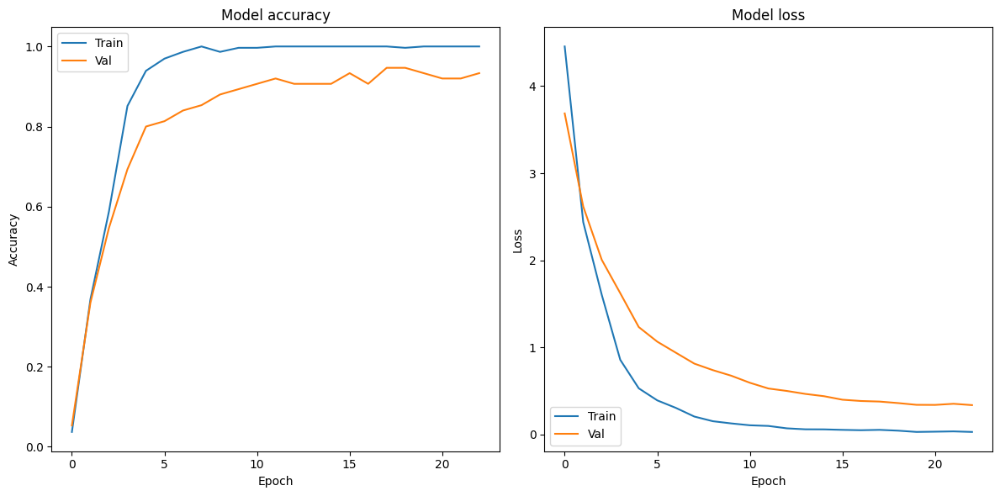

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

ax1.plot(hist.history['accuracy'])
ax1.plot(hist.history['val_accuracy'])
ax1.set_title('Model accuracy')
ax1.set_ylabel('Accuracy')
ax1.set_xlabel('Epoch')
ax1.legend(['Train', 'Val'], loc='upper left')

ax2.plot(hist.history['loss'])
ax2.plot(hist.history['val_loss'])
ax2.set_title('Model loss')
ax2.set_ylabel('Loss')
ax2.set_xlabel('Epoch')
ax2.legend(['Train', 'Val'], loc='lower left')

plt.tight_layout()
plt.show()

Učitavanje modela iz datoteke "model.h5" koja sadrži spremljeni model.

In [ ]:
from tensorflow.keras import models as tf_models
model = tf_models.load_model('model.h5')

Sledi prikaz algoritma na konkretnim primerima, odnosno nad slikama iz seta podataka. Iznad figurice piše predviđena vrednost, a ispod slike stvarna vrednost, odnosno klasa kojoj figura pripada.

1/1 [==============================] - 2s 2s/step
Class: 32 Minifigure: JANNAH


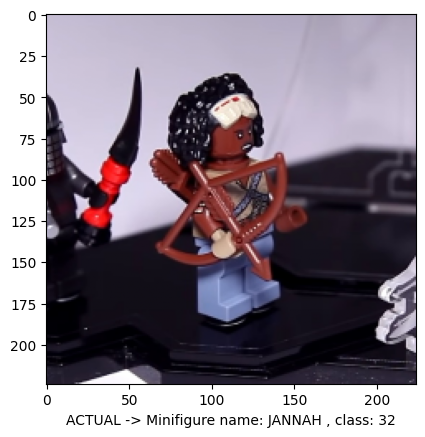

1/1 [==============================] - 0s 177ms/step
Class: 32 Minifigure: JANNAH


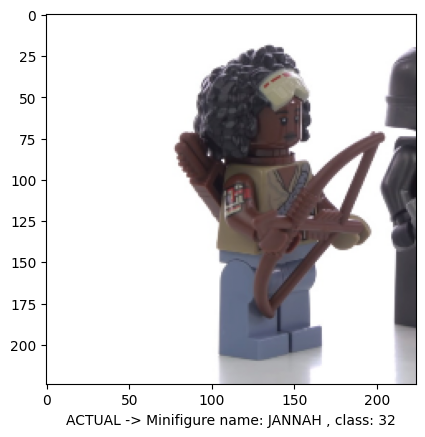

1/1 [==============================] - 0s 192ms/step
Class: 32 Minifigure: JANNAH


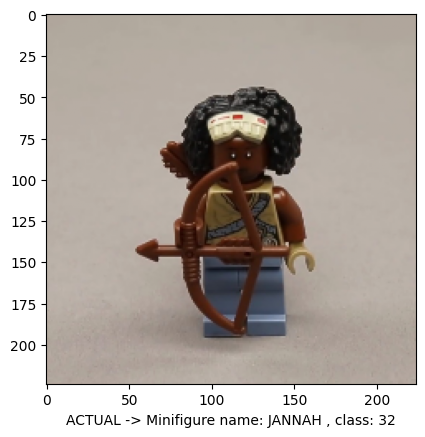

1/1 [==============================] - 0s 178ms/step
Class: 32 Minifigure: JANNAH


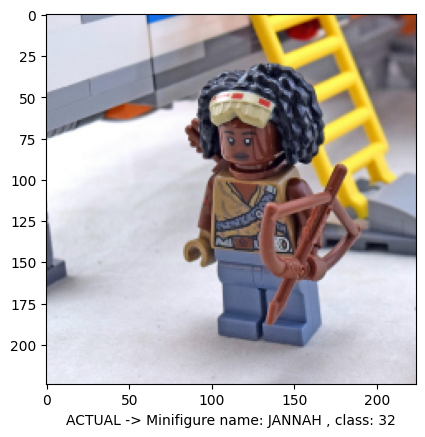

1/1 [==============================] - 0s 253ms/step
Class: 1 Minifigure: SPIDER-MAN


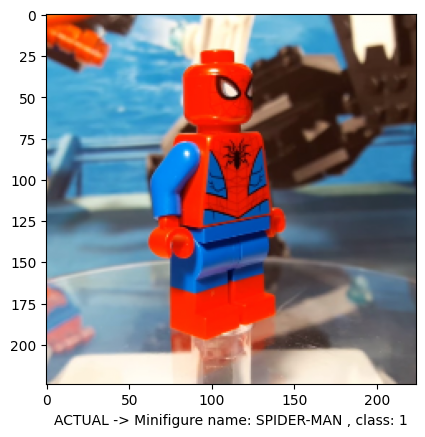

1/1 [==============================] - 0s 197ms/step
Class: 3 Minifigure: AUNT MAY


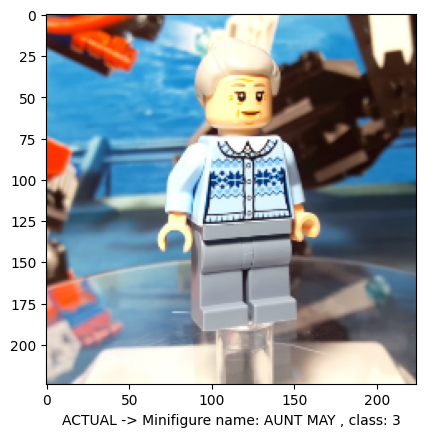

1/1 [==============================] - 0s 183ms/step
Class: 2 Minifigure: VENOM


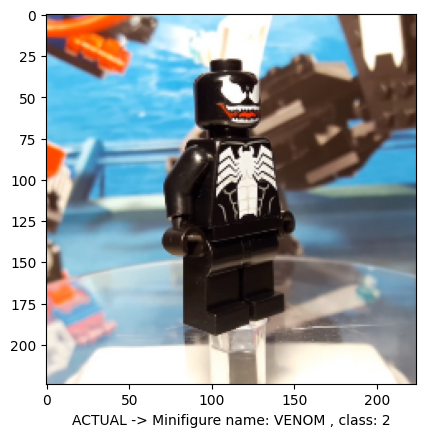

1/1 [==============================] - 0s 192ms/step
Class: 4 Minifigure: GHOST SPIDER


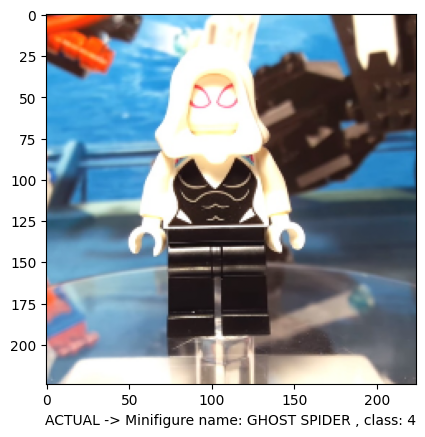

1/1 [==============================] - 0s 225ms/step
Class: 1 Minifigure: SPIDER-MAN


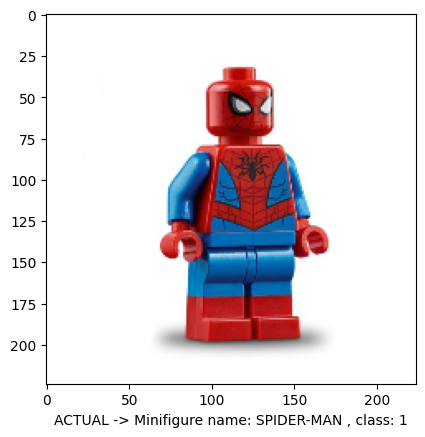

1/1 [==============================] - 0s 184ms/step
Class: 3 Minifigure: AUNT MAY


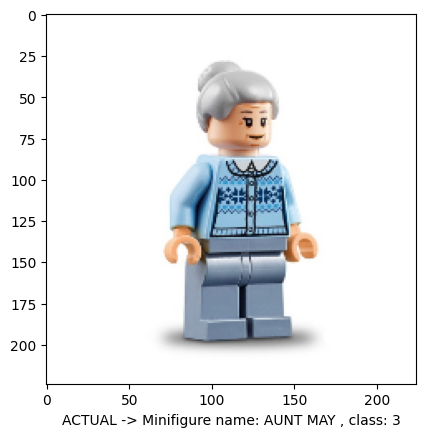

1/1 [==============================] - 0s 176ms/step
Class: 4 Minifigure: GHOST SPIDER


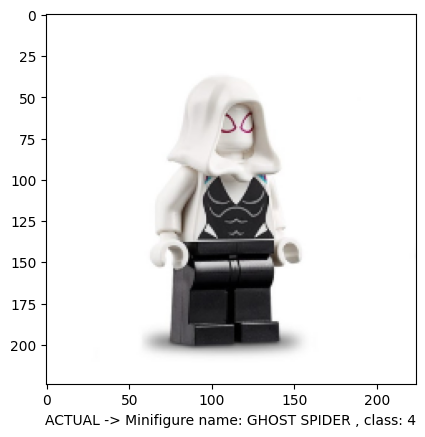

1/1 [==============================] - 0s 197ms/step
Class: 17 Minifigure: SPIDER-MAN


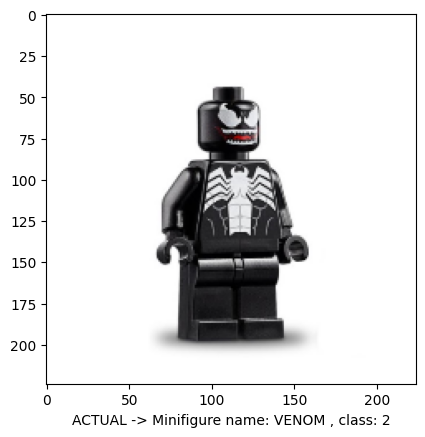

1/1 [==============================] - 0s 251ms/step
Class: 5 Minifigure: YODA


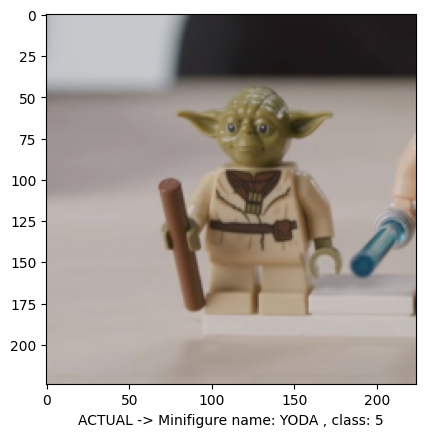

1/1 [==============================] - 0s 183ms/step
Class: 6 Minifigure: LUKE SKYWALKER


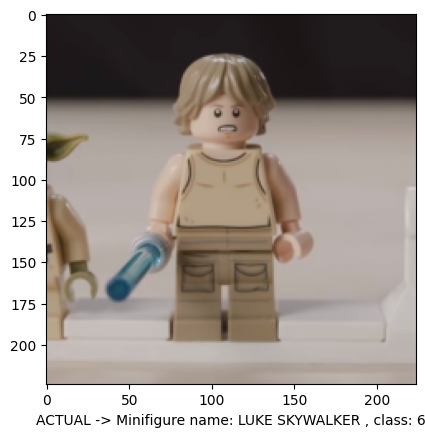

1/1 [==============================] - 0s 261ms/step
Class: 7 Minifigure: R2-D2


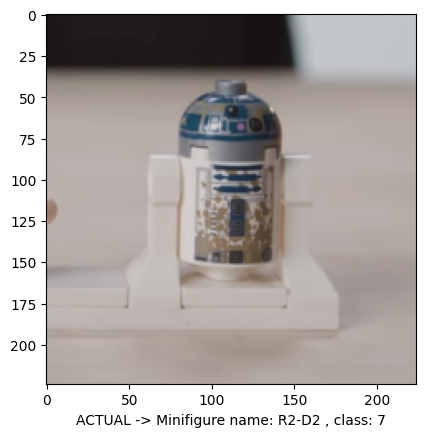

1/1 [==============================] - 0s 220ms/step
Class: 5 Minifigure: YODA


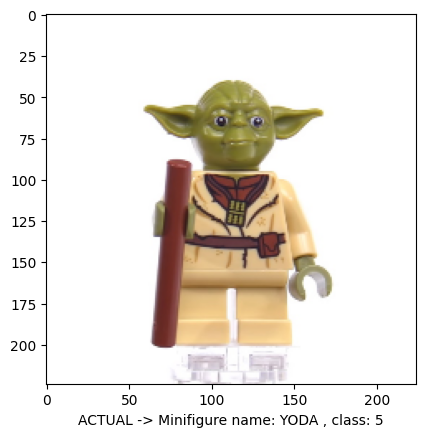

1/1 [==============================] - 0s 177ms/step
Class: 6 Minifigure: LUKE SKYWALKER


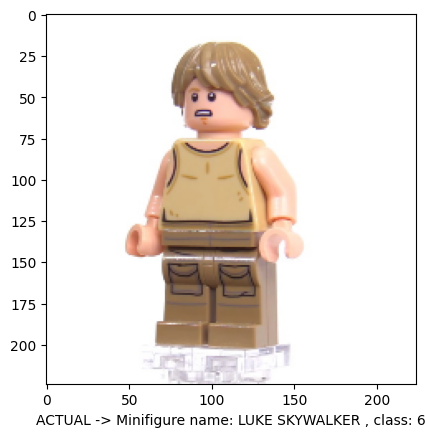

1/1 [==============================] - 0s 186ms/step
Class: 7 Minifigure: R2-D2


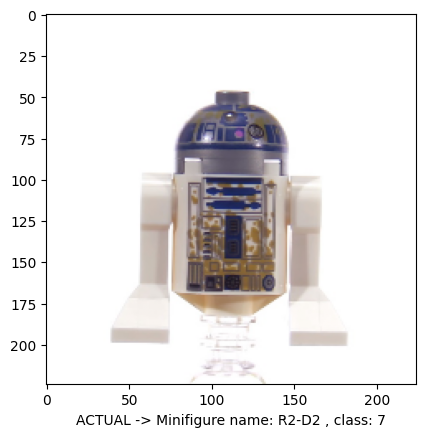

1/1 [==============================] - 0s 176ms/step
Class: 18 Minifigure: HARRY POTTER


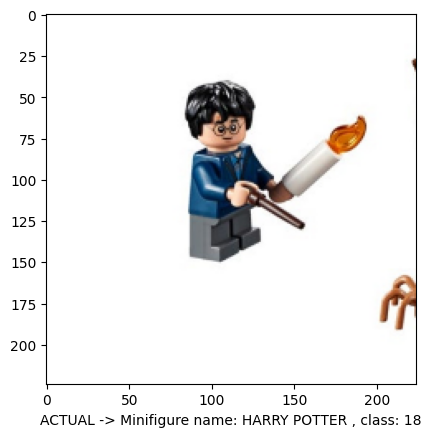

1/1 [==============================] - 0s 194ms/step
Class: 18 Minifigure: HARRY POTTER


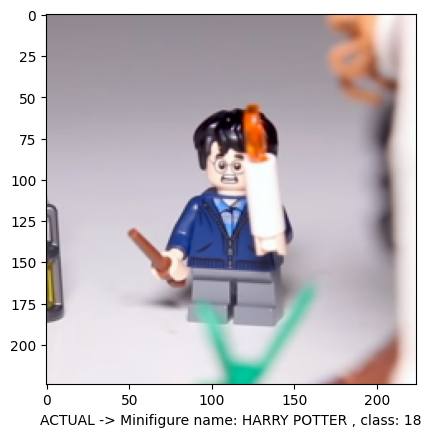

1/1 [==============================] - 0s 176ms/step
Class: 19 Minifigure: RON WEASLEY


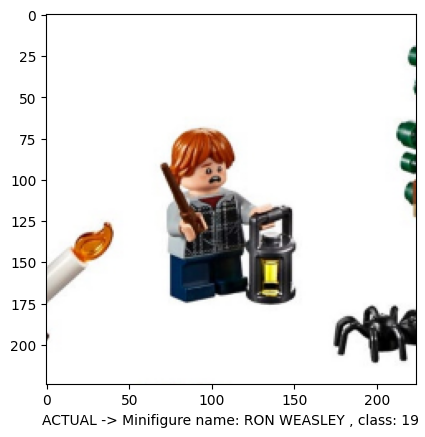

1/1 [==============================] - 0s 187ms/step
Class: 19 Minifigure: RON WEASLEY


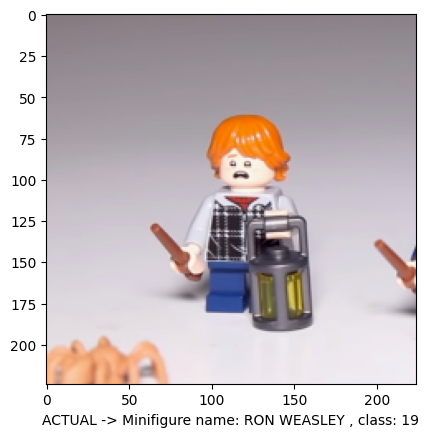

1/1 [==============================] - 0s 167ms/step
Class: 26 Minifigure: OWEN GRADY


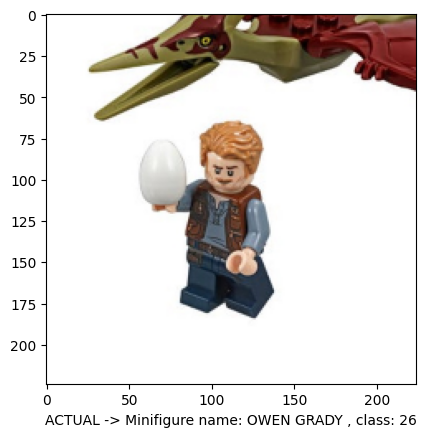

1/1 [==============================] - 0s 178ms/step
Class: 26 Minifigure: OWEN GRADY


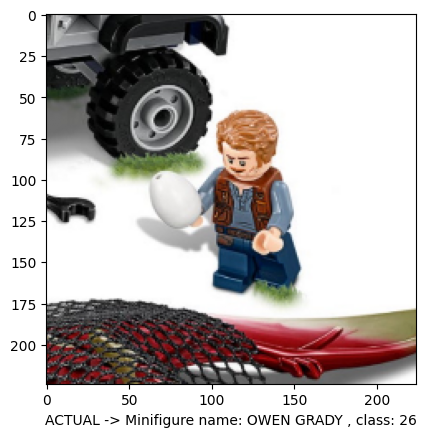

1/1 [==============================] - 0s 167ms/step
Class: 18 Minifigure: HARRY POTTER


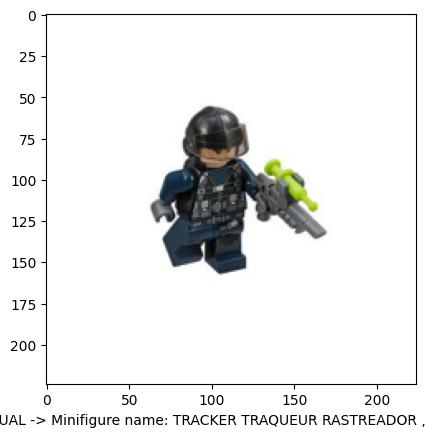

1/1 [==============================] - 0s 228ms/step
Class: 27 Minifigure: TRACKER TRAQUEUR RASTREADOR


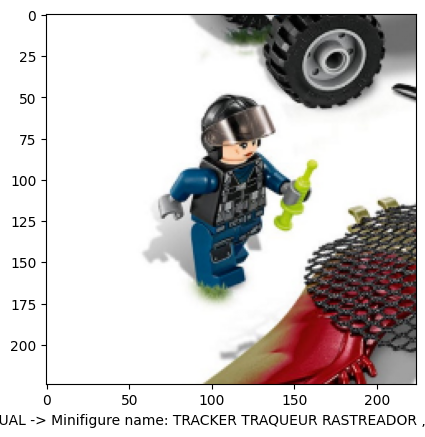

1/1 [==============================] - 0s 190ms/step
Class: 15 Minifigure: MYSTERIO


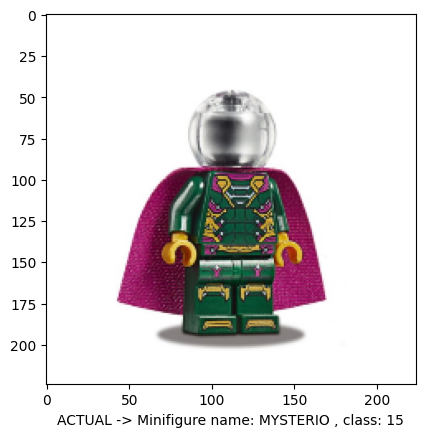

1/1 [==============================] - 0s 177ms/step
Class: 16 Minifigure: FIREFIGHTER


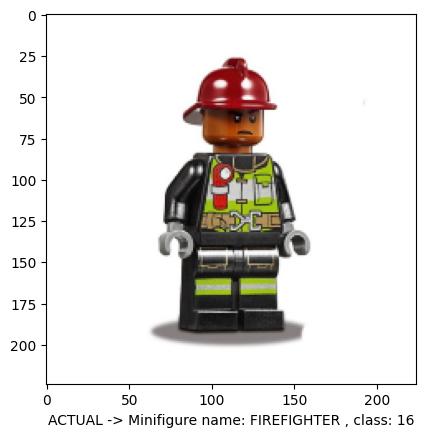

1/1 [==============================] - 0s 223ms/step
Class: 17 Minifigure: SPIDER-MAN


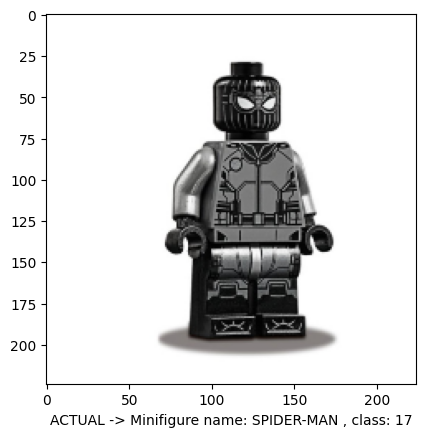

1/1 [==============================] - 0s 174ms/step
Class: 14 Minifigure: KLATOOINIAN RAIDER 2


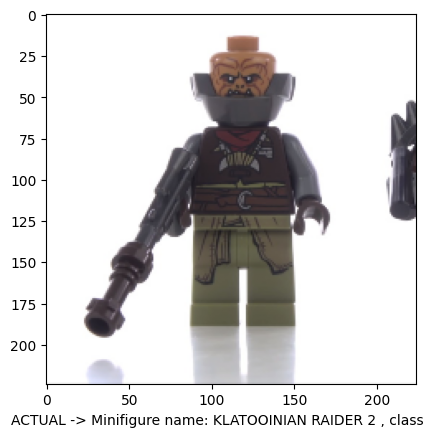

1/1 [==============================] - 0s 166ms/step
Class: 20 Minifigure: BLACK WIDOW


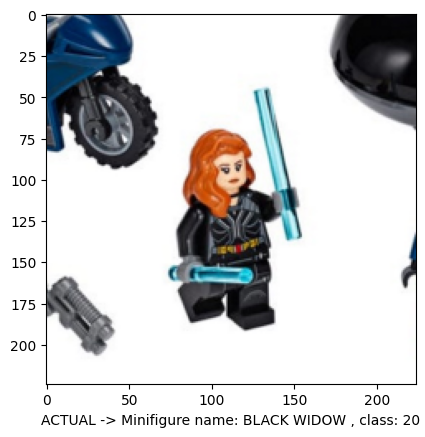

1/1 [==============================] - 0s 169ms/step
Class: 12 Minifigure: CARA DUNE


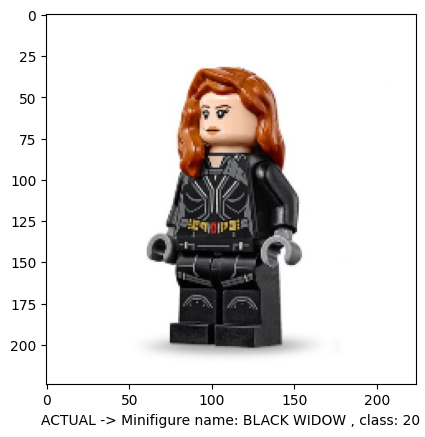

1/1 [==============================] - 0s 168ms/step
Class: 20 Minifigure: BLACK WIDOW


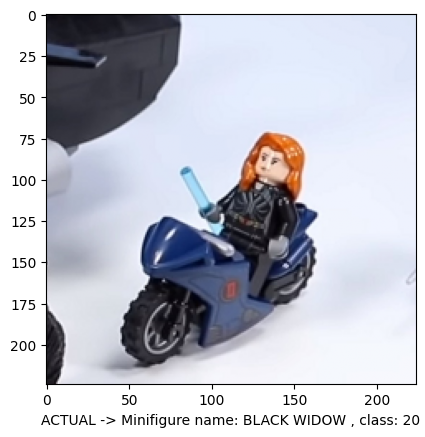

1/1 [==============================] - 0s 175ms/step
Class: 21 Minifigure: YELENA BELOVA


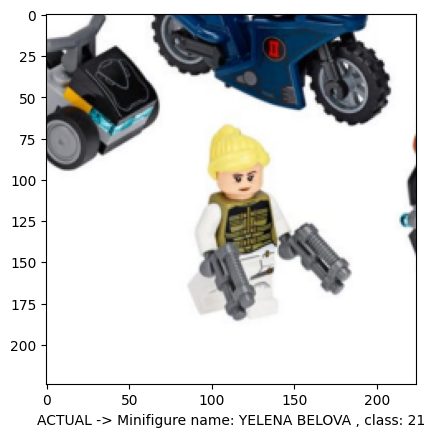

1/1 [==============================] - 0s 167ms/step
Class: 21 Minifigure: YELENA BELOVA


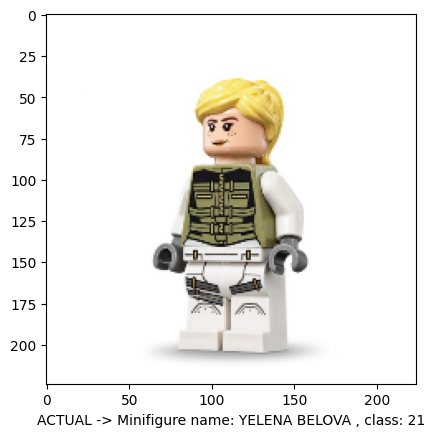

1/1 [==============================] - 0s 167ms/step
Class: 20 Minifigure: BLACK WIDOW


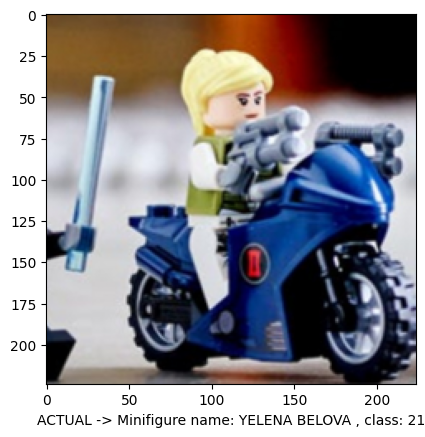

1/1 [==============================] - 0s 169ms/step
Class: 22 Minifigure: TASKMASTER


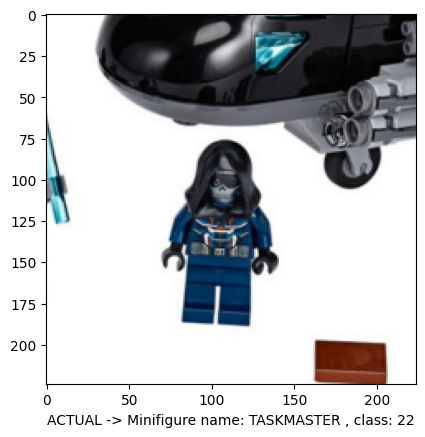

1/1 [==============================] - 0s 184ms/step
Class: 22 Minifigure: TASKMASTER


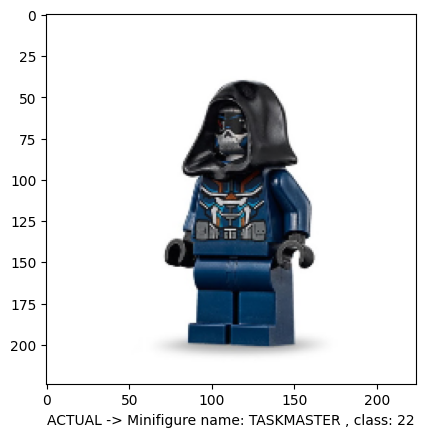

1/1 [==============================] - 0s 184ms/step
Class: 22 Minifigure: TASKMASTER


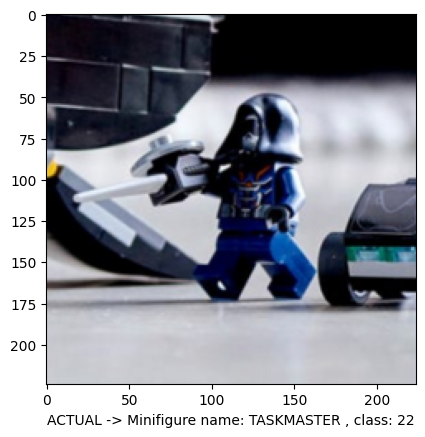

1/1 [==============================] - 0s 192ms/step
Class: 23 Minifigure: CAPTAIN AMERICA


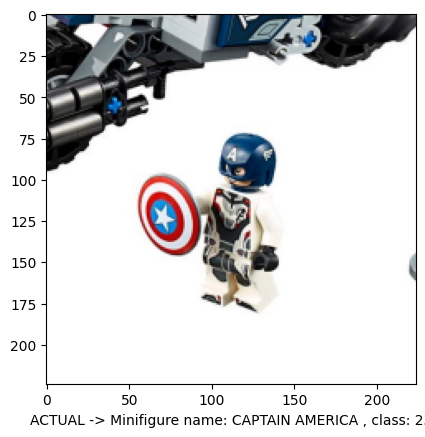

1/1 [==============================] - 0s 184ms/step
Class: 23 Minifigure: CAPTAIN AMERICA


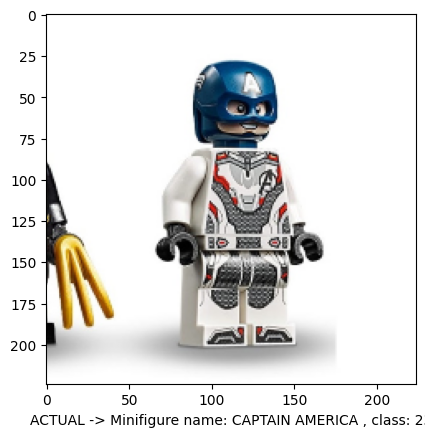

1/1 [==============================] - 0s 203ms/step
Class: 24 Minifigure: OUTRIDER 1


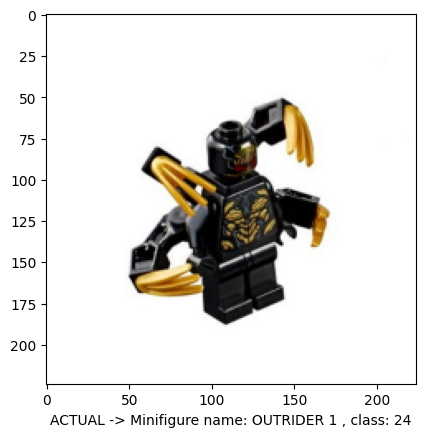

1/1 [==============================] - 0s 187ms/step
Class: 24 Minifigure: OUTRIDER 1


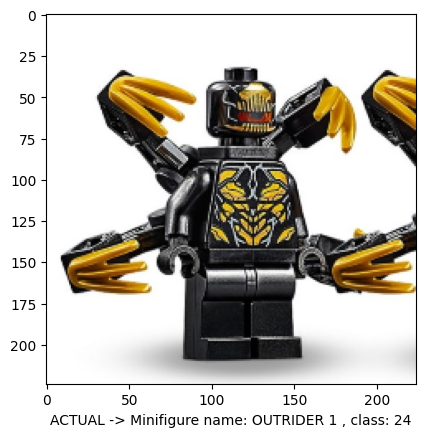

1/1 [==============================] - 0s 191ms/step
Class: 25 Minifigure: OUTRIDER 2


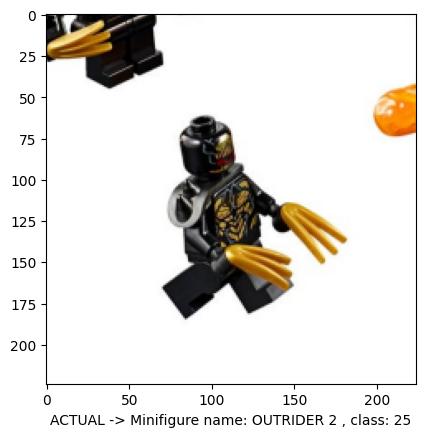

1/1 [==============================] - 0s 183ms/step
Class: 25 Minifigure: OUTRIDER 2


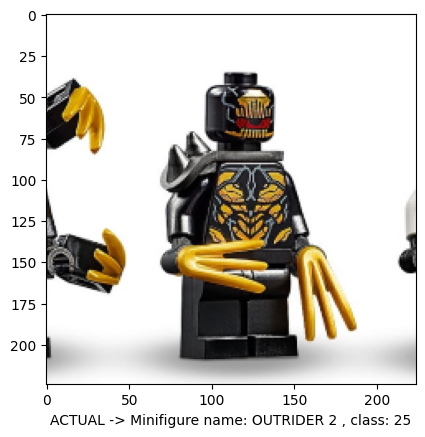

1/1 [==============================] - 0s 169ms/step
Class: 25 Minifigure: OUTRIDER 2


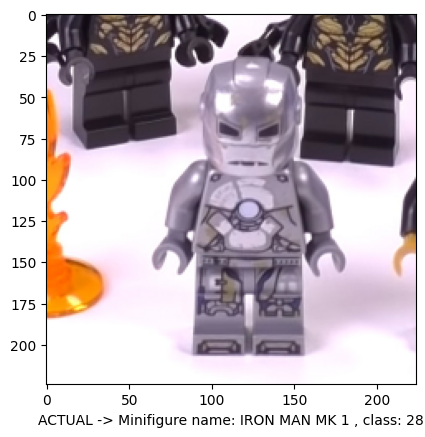

1/1 [==============================] - 0s 170ms/step
Class: 28 Minifigure: IRON MAN MK 1


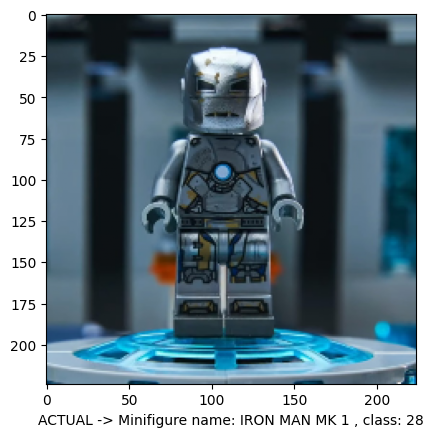

1/1 [==============================] - 0s 188ms/step
Class: 29 Minifigure: IRON MAN MK 5


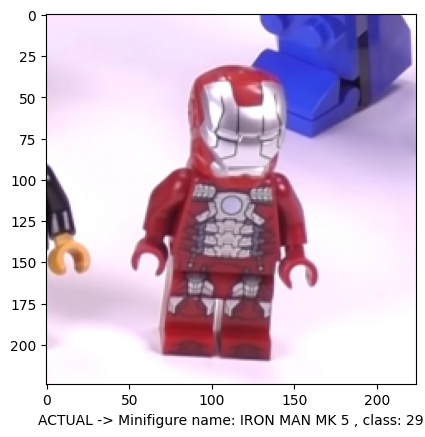

1/1 [==============================] - 0s 169ms/step
Class: 29 Minifigure: IRON MAN MK 5


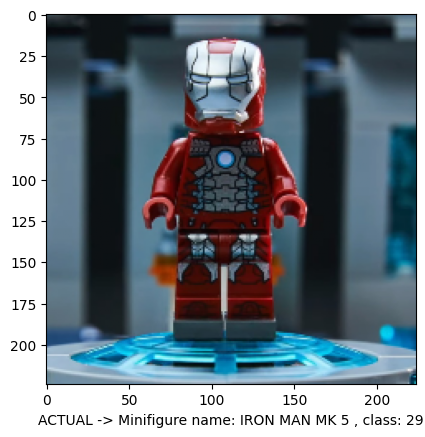

1/1 [==============================] - 0s 168ms/step
Class: 30 Minifigure: IRON MAN MK 41


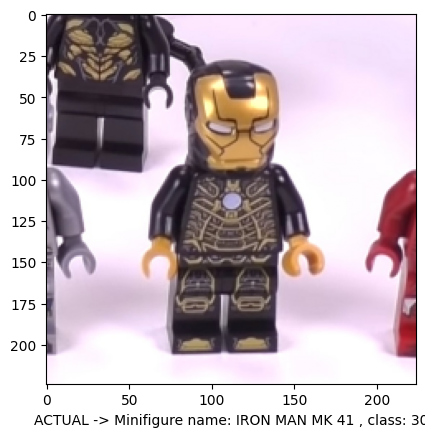

1/1 [==============================] - 0s 168ms/step
Class: 30 Minifigure: IRON MAN MK 41


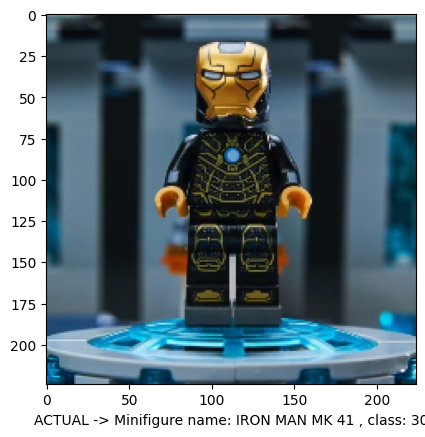

1/1 [==============================] - 0s 181ms/step
Class: 31 Minifigure: IRON MAN MK 50


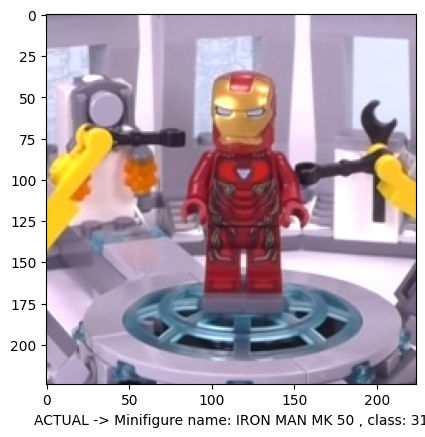

1/1 [==============================] - 0s 171ms/step
Class: 31 Minifigure: IRON MAN MK 50


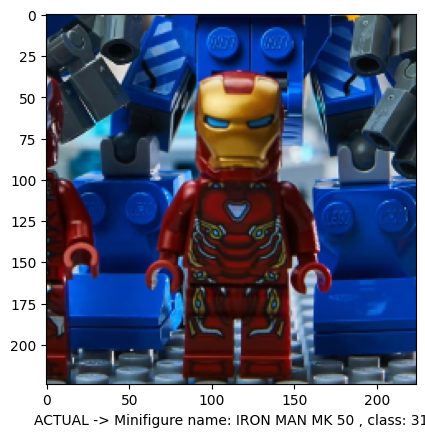

1/1 [==============================] - 0s 176ms/step
Class: 8 Minifigure: MACE WINDU


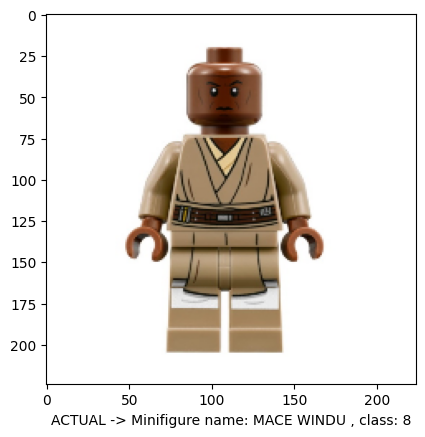

1/1 [==============================] - 0s 173ms/step
Class: 8 Minifigure: MACE WINDU


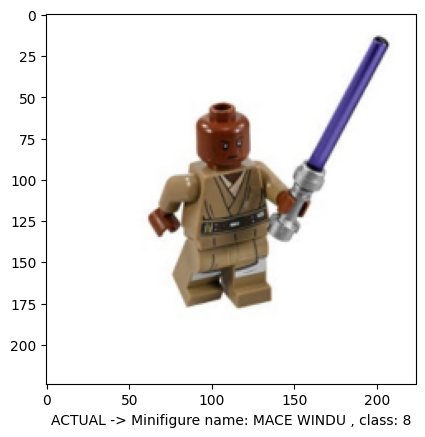

1/1 [==============================] - 0s 173ms/step
Class: 9 Minifigure: GENERAL GRIEVOUS


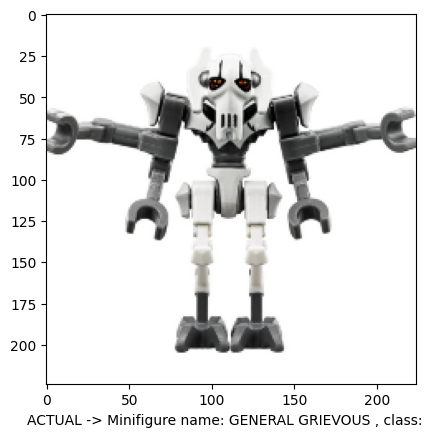

1/1 [==============================] - 0s 175ms/step
Class: 9 Minifigure: GENERAL GRIEVOUS


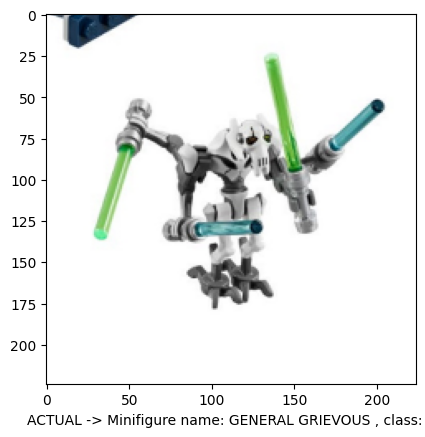

1/1 [==============================] - 0s 171ms/step
Class: 10 Minifigure: KYLO REN


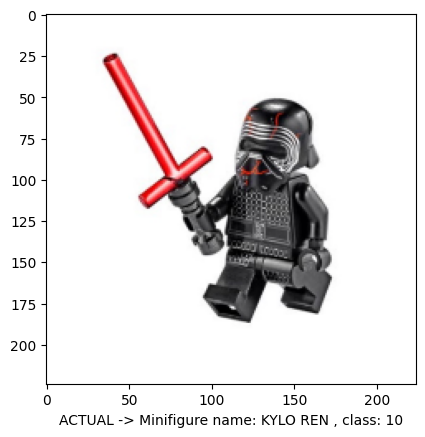

1/1 [==============================] - 0s 176ms/step
Class: 10 Minifigure: KYLO REN


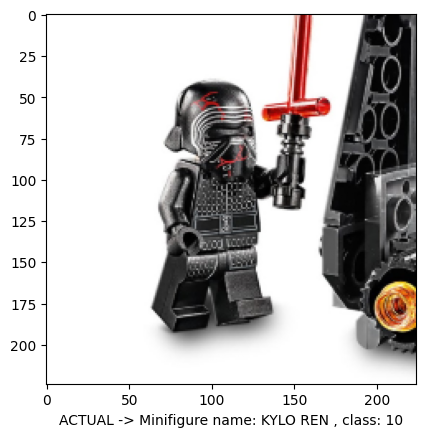

1/1 [==============================] - 0s 217ms/step
Class: 16 Minifigure: FIREFIGHTER


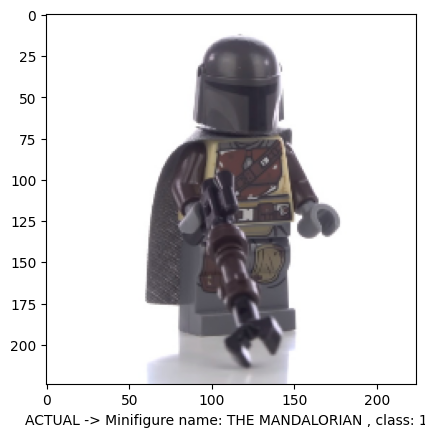

1/1 [==============================] - 0s 174ms/step
Class: 12 Minifigure: CARA DUNE


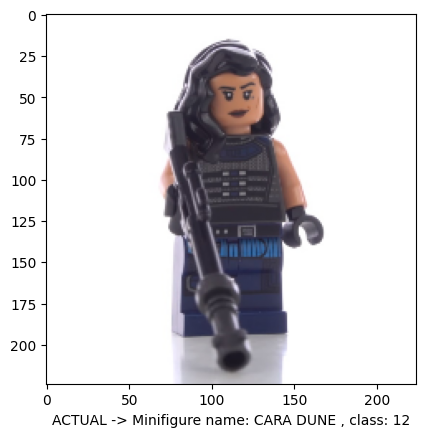

1/1 [==============================] - 0s 180ms/step
Class: 13 Minifigure: KLATOOINIAN RAIDER 1


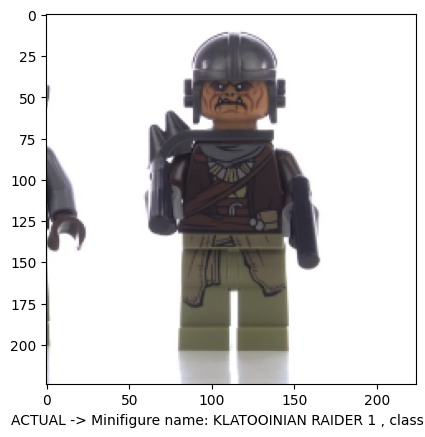

1/1 [==============================] - 0s 176ms/step
Class: 37 Minifigure: OBI-WAN KENOBI


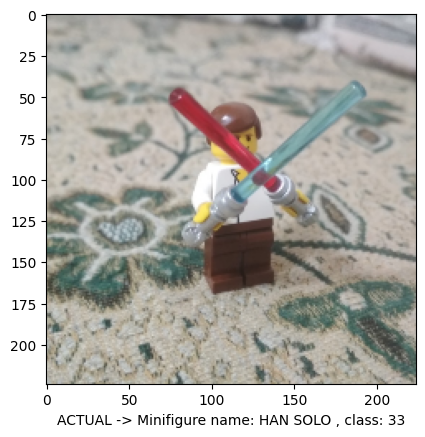

1/1 [==============================] - 0s 183ms/step
Class: 33 Minifigure: HAN SOLO


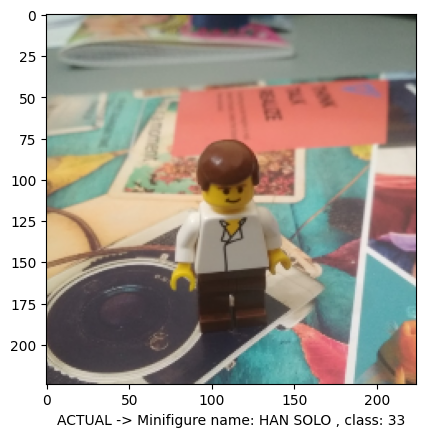

1/1 [==============================] - 0s 279ms/step
Class: 34 Minifigure: DARTH VADER


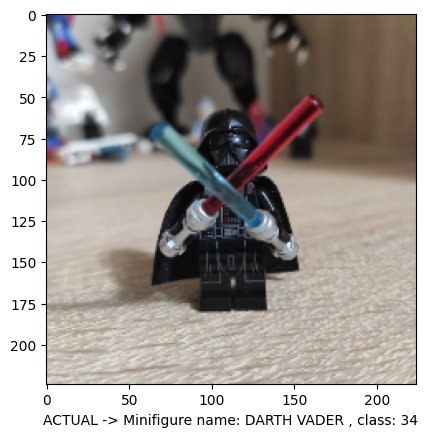

1/1 [==============================] - 0s 174ms/step
Class: 34 Minifigure: DARTH VADER


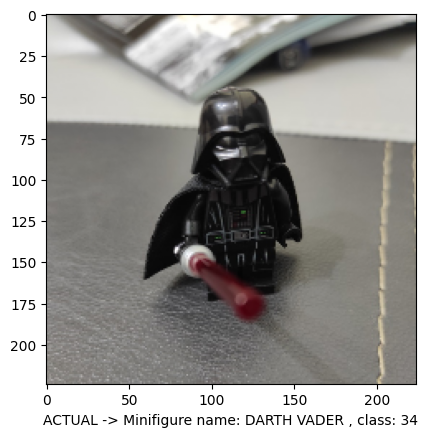

1/1 [==============================] - 0s 258ms/step
Class: 34 Minifigure: DARTH VADER


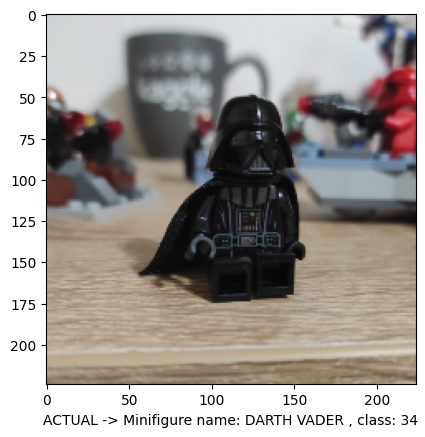

1/1 [==============================] - 0s 241ms/step
Class: 34 Minifigure: DARTH VADER


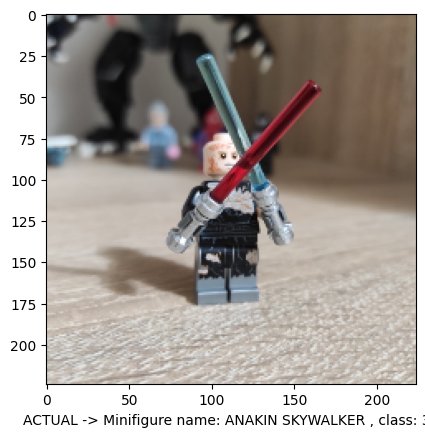

1/1 [==============================] - 0s 170ms/step
Class: 35 Minifigure: ANAKIN SKYWALKER


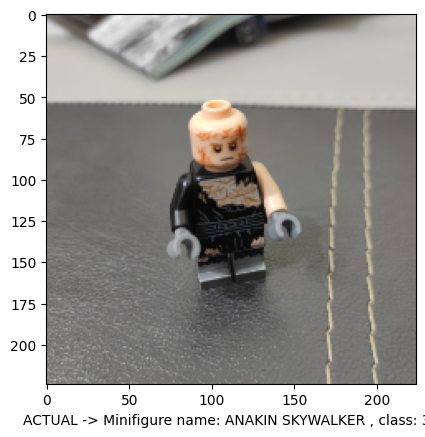

1/1 [==============================] - 0s 216ms/step
Class: 35 Minifigure: ANAKIN SKYWALKER


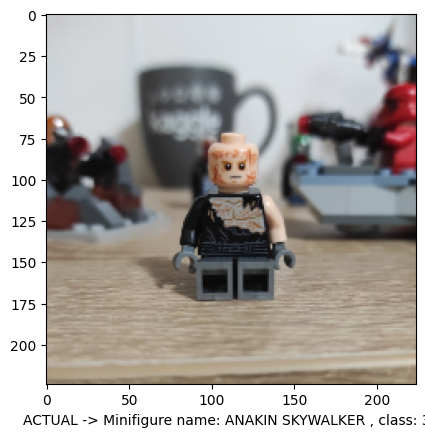

1/1 [==============================] - 0s 263ms/step
Class: 36 Minifigure: EMPEROR PALPATINE


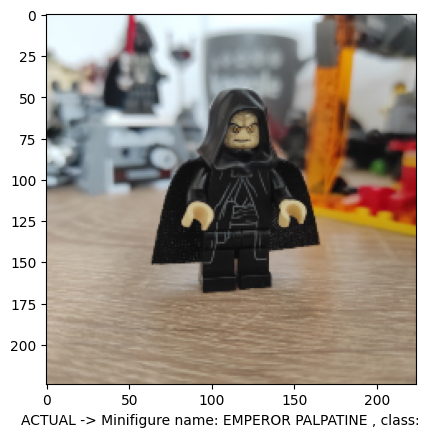

1/1 [==============================] - 0s 168ms/step
Class: 36 Minifigure: EMPEROR PALPATINE


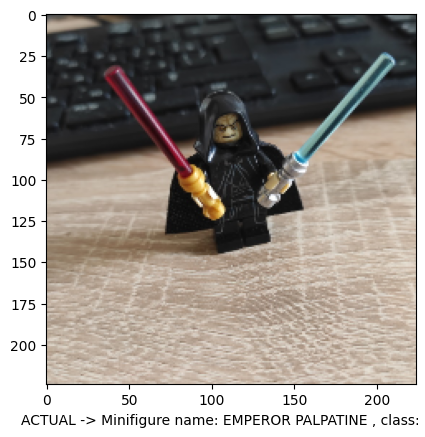

1/1 [==============================] - 0s 173ms/step
Class: 36 Minifigure: EMPEROR PALPATINE


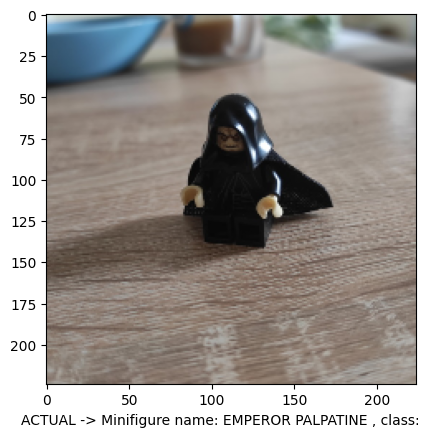

1/1 [==============================] - 0s 178ms/step
Class: 37 Minifigure: OBI-WAN KENOBI


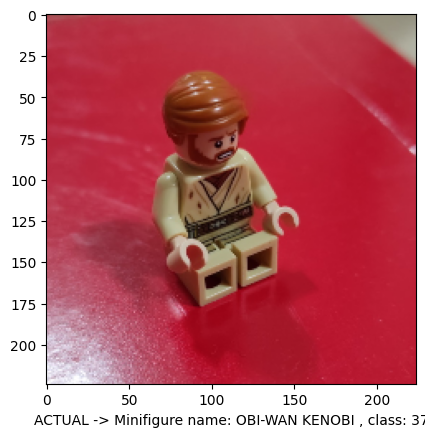

1/1 [==============================] - 0s 190ms/step
Class: 37 Minifigure: OBI-WAN KENOBI


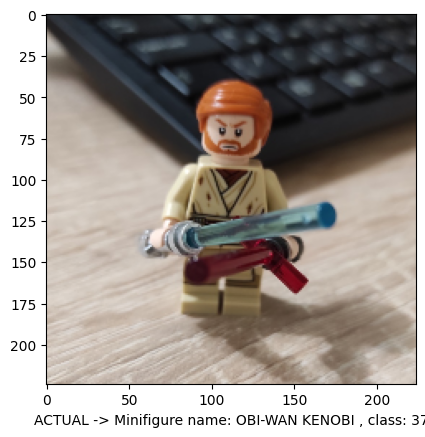

1/1 [==============================] - 0s 237ms/step
Class: 37 Minifigure: OBI-WAN KENOBI


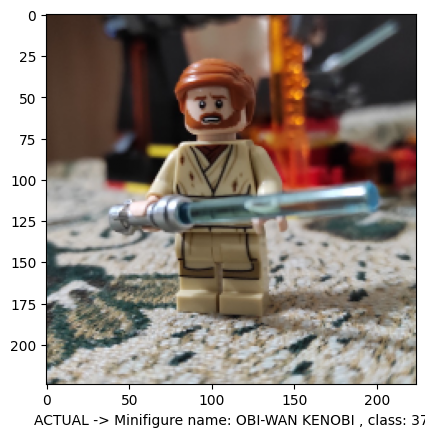

1/1 [==============================] - 0s 206ms/step
Class: 38 Minifigure: BOBA FETT


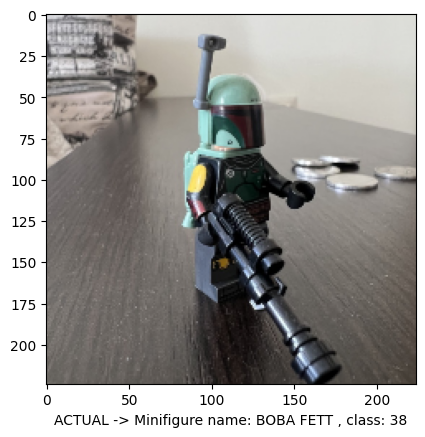

1/1 [==============================] - 0s 195ms/step
Class: 38 Minifigure: BOBA FETT


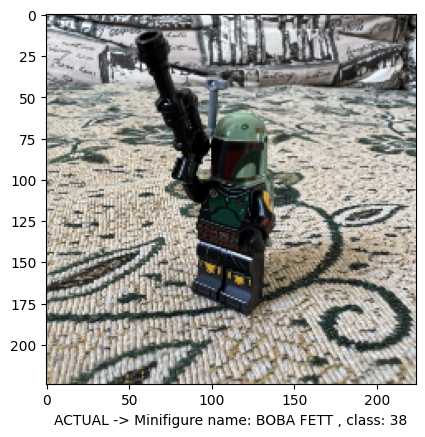

1/1 [==============================] - 0s 226ms/step
Class: 38 Minifigure: BOBA FETT


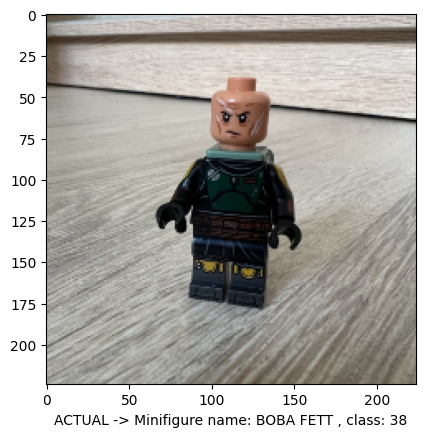

In [ ]:
for i in range(len(test_df)):

    image = cv2.imread(X_test['path'].values[i])
    image = cv2.resize(image, dsize=(224,224))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)/255
    plt.imshow(image)
    plt.xlabel('ACTUAL -> Minifigure name: ' + test_actual_df['minifigure_name'].values[i]+' , class: '+str(test_actual_df['class_id'].values[i]))
    image = np.reshape(image, (1, 224, 224, 3))
    ans = model.predict(image).argmax()
    ans = ans+1
    minifigure = metadata_df["minifigure_name"][metadata_df["class_id"] == ans].iloc[0]
    print("Class:", str(ans)+ " Minifigure:",minifigure)
    plt.show()

In [ ]:
Na kraju sledi provera kolika je tačnost, a koliki gubitak na validacionim podacima koji smo dobili nakon treniranja modela na ovoj mreži.

In [ ]:
loss, accuracy = model.evaluate(X_val_converted, y_val_converted, verbose=1)

print('Test loss:', loss)
print('Test accuracy:', accuracy)

3/3 [==============================] - 11s 2s/step - loss: 0.3781 - accuracy: 0.9467
Test loss: 0.37812405824661255
Test accuracy: 0.9466666579246521


# **Zaključak**
Zaključak ovog istraživanja ukazuje na uspešnu primenu modela DenseNet121 u klasifikaciji Lego figura. Kroz ovu studiju, dokazali smo da je ovaj duboki model sposoban da sa visokom tačnošću prepozna različite Lego figure na osnovu slika. Ovo istraživanje je pokazalo da je DenseNet121 efikasan u rešavanju problema prepoznavanja objekata u realnom svetu, čak i kada su slike različite po osvetljenju, pozadini i orijentaciji figura.

Takođe, uočili smo da je kvalitet podataka za obuku od suštinskog značaja za postizanje visokih performansi ovog modela. Pažljivo prikupljen i obrađen skup podataka omogućava DenseNet121 da se bolje prilagodi varijacijama u slikama Lego figura.

U budućnosti, mogli bismo dodatno unaprediti ovu klasifikaciju primenom tehnika kao što su augmentacija podataka i fine-tjuning modela. Takođe, istraživanja se mogu proširiti na više različitih klasa Lego figura, čime bi se povećala složenost problema i proširila primena ovog modela.

U celini, rezultati ovog rada pokazuju da je DenseNet121 moćan alat za klasifikaciju Lego figura, otvarajući mogućnosti za primenu dubokih neuronskih mreža u različitim zadacima vezanim za prepoznavanje i klasifikaciju objekata u stvarnom svetu.

# **Reference**

1. https://ml.matf.bg.ac.rs/readings/ml.pdf
2. http://ri4es.etf.rs/materijali/predavanja_old_/IS_P11_MasinskoUcenje.pdf
3. https://www.infolopare.com/nekategorizovano/harnessing-the-potential-of-ai-densenet-for-advanced-image-classification/17837/
4. https://pandas.pydata.org/
5. https://keras.io/api/applications/densenet/#densenet121-function
6. https://keras.io/api/callbacks/early_stopping/